<a href="https://colab.research.google.com/github/QuothTheRaven42/012_EDA_Part_1/blob/master/denoise_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import pathlib
import fastai
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from fastai.utils.mem import *

from torchvision.models import vgg16_bn
from subprocess import check_output

In [3]:
input_path = Path('/content/')
items = list(input_path.glob("*.zip"))
print([x for x in items])

[PosixPath('/content/test.zip'), PosixPath('/content/denoising-dirty-documents.zip'), PosixPath('/content/train.zip'), PosixPath('/content/sampleSubmission.csv.zip'), PosixPath('/content/train_cleaned.zip')]


In [4]:
import zipfile

for item in items:
    print(item)
    with zipfile.ZipFile(str(item), "r") as z:
        z.extractall(".")

/content/test.zip
/content/denoising-dirty-documents.zip
/content/train.zip
/content/sampleSubmission.csv.zip
/content/train_cleaned.zip


In [5]:
bs, size = 4, 128
arch = models.resnet34
path_train = Path("train")
path_train_cleaned = Path("train_cleaned")
path_test = Path("test")
path_submission = Path("submission")

In [6]:
src = ImageImageList.from_folder(path_train).split_by_rand_pct(0.2, seed=42)


In [7]:
def get_data(src, bs, size):
    data = (
        src.label_from_func(lambda x: path_train_cleaned / x.name)
           .transform(get_transforms(max_zoom=2.), size=size, tfm_y=True)
           .databunch(bs=bs)       
           .normalize(imagenet_stats, do_y=True)
    )
    data.c = 3
    return data

In [8]:
data = get_data(src, bs, size)

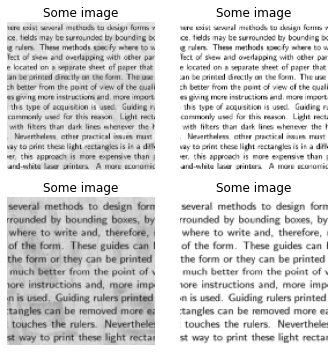

In [9]:
data.show_batch(ds_type=DatasetType.Valid, rows=2, figsize=(5, 5), title="Some image")

In [10]:
t = data.valid_ds[0][1].data
t = torch.stack([t,t])

In [11]:
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [12]:
base_loss = F.l1_loss

In [13]:
vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

In [14]:
# Show the layers before all pooling layers, which turn out to be ReLU activations.
# This is right before the grid size changes in the VGG model, which we are using
# for feature generation.
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True)])

In [15]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        """ m_feat is the pretrained model """
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        # hooking grabs intermediate layers
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        # get features for target
        out_feat = self.make_features(target, clone=True)
        # features for input
        in_feat = self.make_features(input)
        # calc l1 pixel loss
        self.feat_losses = [base_loss(input,target)]
        # get l1 loss from all the block activations
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        # so we can show all the layer loss amounts
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()


In [16]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

In [17]:
wd = 1e-3
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,
                     blur=True, norm_type=NormType.Weight)
gc.collect();

In [18]:
learn.model_dir = Path('models').absolute()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


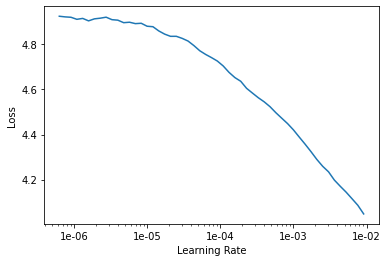

In [19]:
learn.lr_find()
learn.recorder.plot()

In [20]:
print(f"Validation set size: {len(data.valid_ds.items)}")

Validation set size: 28


In [21]:
lr = 1e-3


In [22]:
def do_fit(save_name, lrs=slice(lr), pct_start=0.9):
    learn.fit_one_cycle(10, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=5, imgsize=15)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,3.691545,3.008078,0.487520,0.267374,0.246615,0.071165,1.095056,0.781835,0.058513,00:04
1,2.998525,1.755373,0.307993,0.156458,0.168045,0.042804,0.537596,0.506092,0.036387,00:04
2,2.237861,1.276884,0.304064,0.108186,0.119767,0.027295,0.340422,0.358903,0.018246,00:04
3,1.889440,0.941959,0.181454,0.098084,0.097308,0.021907,0.266903,0.261200,0.015103,00:04
4,1.574355,0.821340,0.205830,0.083495,0.080045,0.017838,0.215018,0.206717,0.012398,00:04
5,1.295307,0.687357,0.133160,0.076659,0.073241,0.013873,0.191493,0.190540,0.008393,00:04
6,1.178202,1.065804,0.393591,0.088035,0.079803,0.017530,0.269186,0.205295,0.012365,00:04
7,1.097412,0.796645,0.181411,0.079810,0.077693,0.015406,0.221529,0.211520,0.009275,00:04
8,0.936492,0.566352,0.115228,0.066487,0.060477,0.010757,0.151340,0.155982,0.006081,00:04
9,0.811188,0.515898,0.115410,0.062892,0.055816,0.009438,0.135576,0.131366,0.005400,00:04


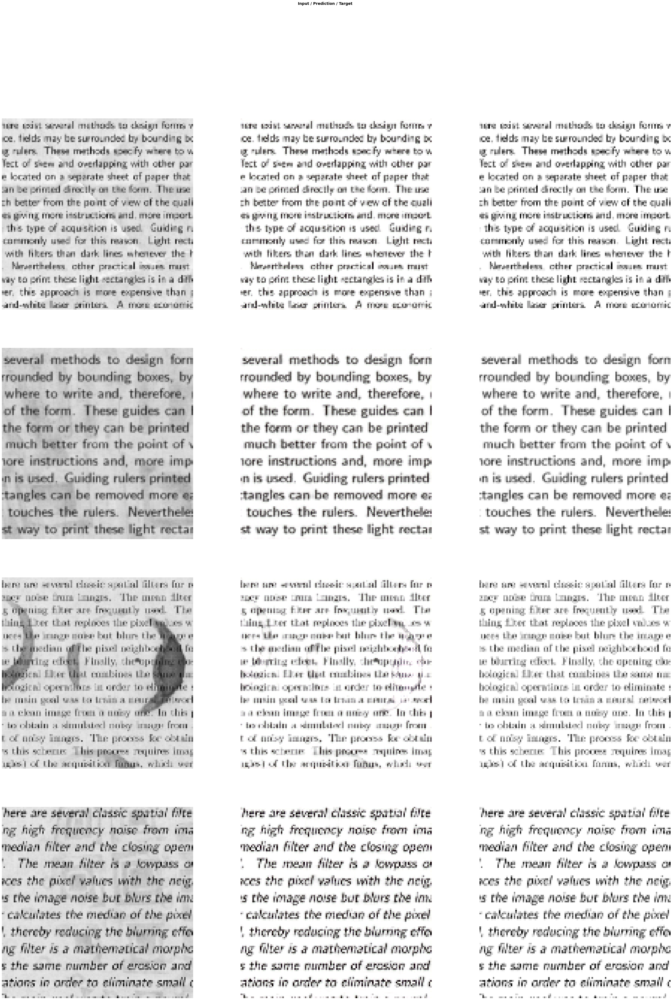

In [23]:
do_fit('1a', slice(lr*10))

In [24]:
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.545608,0.489410,0.108840,0.061379,0.053422,0.009048,0.128551,0.123046,0.005123,00:04
1,0.541431,0.500804,0.107386,0.060991,0.054065,0.009250,0.134372,0.129534,0.005205,00:04
2,0.528677,0.441669,0.099572,0.056725,0.049216,0.008097,0.111754,0.111848,0.004456,00:04
3,0.502835,0.433831,0.093963,0.055506,0.048373,0.008015,0.112573,0.110979,0.004421,00:04
4,0.485004,0.409244,0.097433,0.052241,0.045048,0.007432,0.101158,0.101928,0.004003,00:04
5,0.472418,0.384205,0.087241,0.050630,0.043766,0.007104,0.094510,0.097110,0.003844,00:04
6,0.468832,0.374197,0.085821,0.050256,0.042896,0.006862,0.093019,0.091672,0.003671,00:04
7,0.446599,0.367794,0.083953,0.048892,0.041532,0.006951,0.092432,0.090331,0.003704,00:04
8,0.444253,0.376639,0.099803,0.049275,0.041334,0.006866,0.089022,0.086580,0.003759,00:04
9,0.426916,0.338768,0.076710,0.046629,0.039886,0.006356,0.080102,0.085674,0.003410,00:04


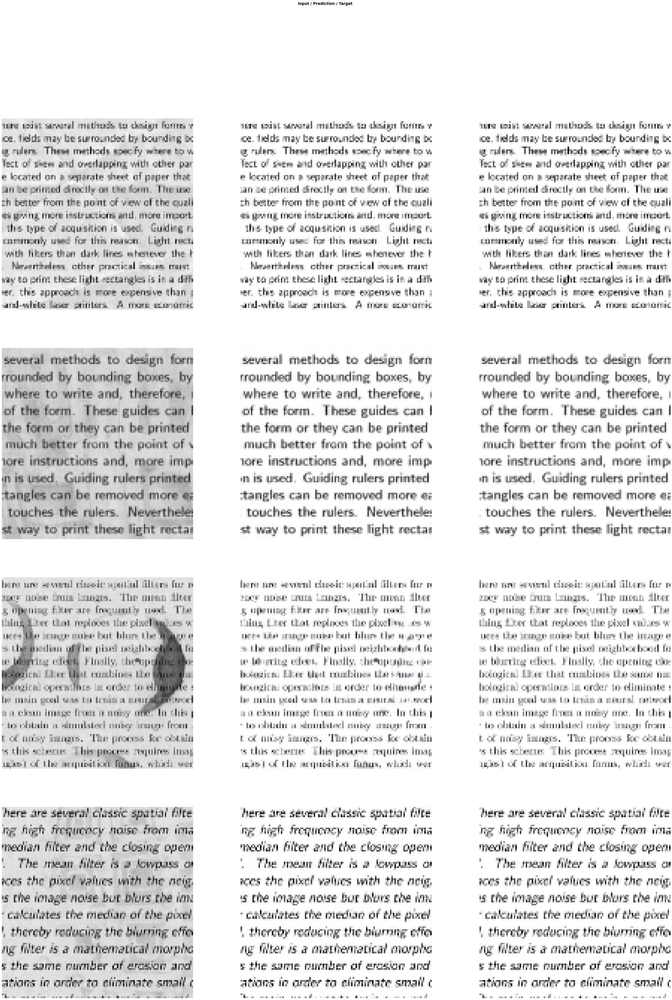

In [25]:
do_fit('1b', slice(1e-5, lr))

In [26]:
# Increase resolution of the images.
data = get_data(src, 12, size*2)

In [27]:
learn.data = data
learn.freeze()
gc.collect()

26500

In [28]:
learn.load('1b');

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.464964,0.326285,0.075003,0.045047,0.040294,0.002972,0.099116,0.063262,0.000591,00:19
1,0.463470,0.340284,0.077490,0.047088,0.042488,0.003103,0.104675,0.064838,0.000601,00:06
2,0.436780,0.309506,0.072547,0.045088,0.040597,0.002906,0.089617,0.058187,0.000563,00:06
3,0.413771,0.295030,0.068317,0.043694,0.038765,0.002823,0.084872,0.056005,0.000554,00:06
4,0.393899,0.279392,0.068072,0.041389,0.036480,0.002580,0.078979,0.051406,0.000486,00:06
5,0.378519,0.272773,0.076187,0.040684,0.035701,0.002497,0.069997,0.047240,0.000466,00:06
6,0.369751,0.266336,0.073797,0.039892,0.034990,0.002461,0.068046,0.046681,0.000468,00:06
7,0.360095,0.255356,0.063598,0.039500,0.034563,0.002408,0.069270,0.045569,0.000449,00:06
8,0.353904,0.260507,0.064648,0.039717,0.034831,0.002473,0.071172,0.047193,0.000472,00:06
9,0.346296,0.251428,0.065038,0.038803,0.033924,0.002376,0.064126,0.046717,0.000445,00:06


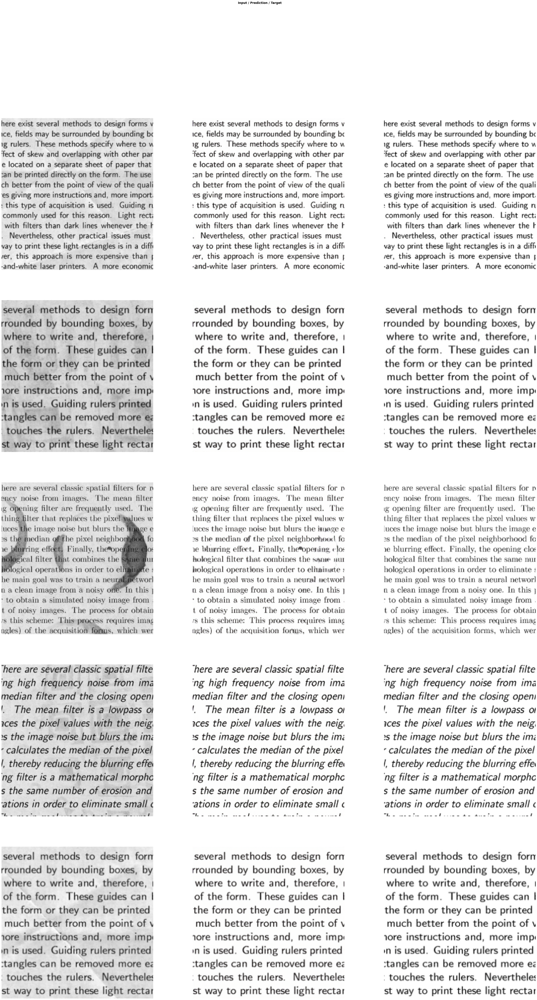

In [29]:
do_fit('2a')

In [30]:
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.302962,0.245179,0.061589,0.038645,0.033750,0.002338,0.063067,0.045356,0.000434,00:07
1,0.296279,0.243534,0.061956,0.038438,0.033520,0.002313,0.063109,0.043773,0.000425,00:06
2,0.293305,0.237489,0.060481,0.037915,0.033034,0.002272,0.060791,0.042576,0.000420,00:06
3,0.292680,0.236724,0.060480,0.037843,0.032945,0.002269,0.060515,0.042252,0.000420,00:06
4,0.291614,0.238791,0.062432,0.037852,0.032956,0.002282,0.060223,0.042623,0.000422,00:06
5,0.290580,0.237685,0.060973,0.037817,0.032922,0.002279,0.060848,0.042425,0.000420,00:06
6,0.289451,0.236796,0.061675,0.037673,0.032773,0.002270,0.059949,0.042036,0.000420,00:06
7,0.285947,0.236255,0.060740,0.037664,0.032776,0.002264,0.060303,0.042090,0.000418,00:06
8,0.284021,0.235374,0.060333,0.037643,0.032751,0.002262,0.060024,0.041944,0.000417,00:06
9,0.284634,0.235320,0.060354,0.037666,0.032774,0.002265,0.059908,0.041934,0.000418,00:06


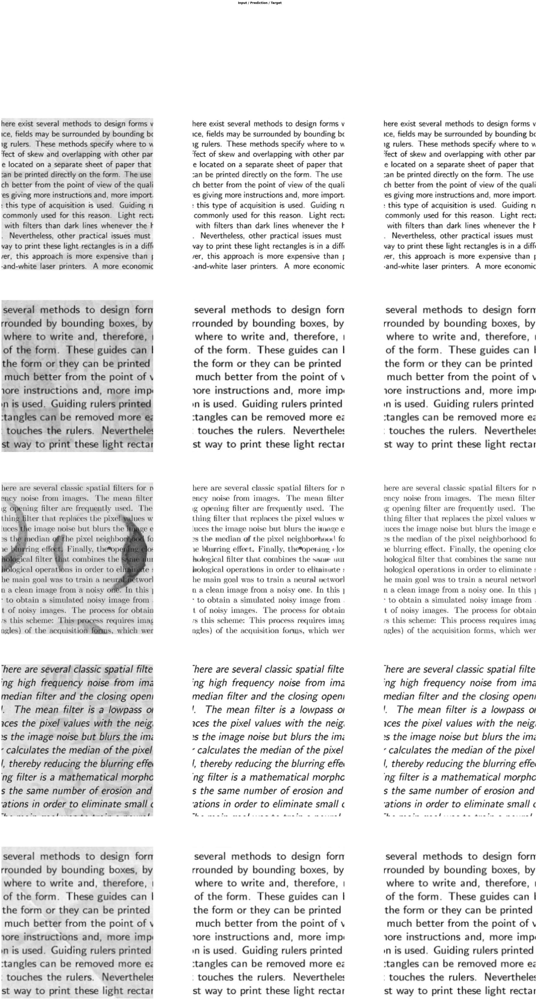

In [31]:
do_fit('2b', slice(1e-6,1e-4), pct_start=0.3)

# save entire configuration
#learn.export(file = model_path)

In [32]:
# test on validation sample

fn = data.valid_ds.x.items[10]; fn

PosixPath('train/131.png')

In [33]:
img = open_image(fn); img.shape

torch.Size([3, 420, 540])

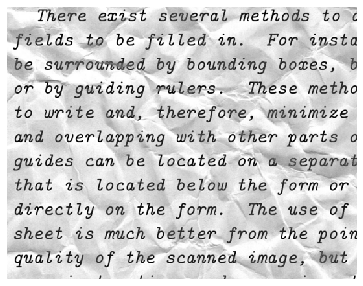

In [34]:
p,img_pred,b = learn.predict(img)
show_image(img, figsize=(8,5), interpolation='nearest');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


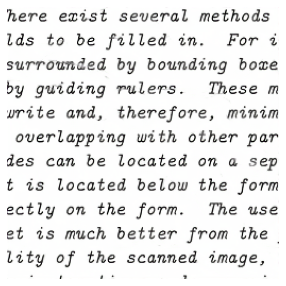

In [35]:
Image(img_pred).show(figsize=(8,5))

In [36]:
# Turn off resizing transformations for inference time.
# https://forums.fast.ai/t/segmentation-mask-prediction-on-different-input-image-sizes/44389
learn.data.single_ds.tfmargs['size'] = None

In [37]:
test_images = ImageImageList.from_folder(path_test)
print(test_images)

ImageImageList (72 items)
Image (3, 420, 540),Image (3, 258, 540),Image (3, 420, 540),Image (3, 420, 540),Image (3, 258, 540)
Path: test


torch.Size([3, 420, 540])

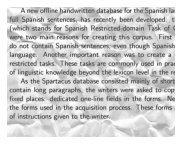

In [38]:
img = test_images[0]
img.show()
img.shape

In [39]:
p, img_pred, b = learn.predict(img)

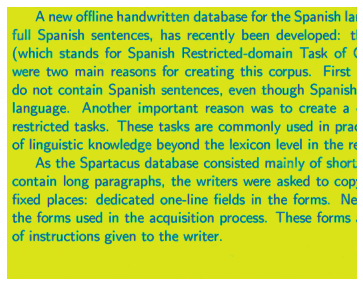

In [40]:
def rgb2gray(_img):
    """ Convert from 3 channels to 1 channel """
    from skimage.color import rgb2gray as _rgb2gray

    # Rotate channels dimension to the end, per skimage's expectations
    _img_pred_np = _img.permute(1, 2, 0).numpy()
    _img_pred_2d = Tensor(_rgb2gray(_img_pred_np))
    # Add the channel dimension back
    _img_pred = _img_pred_2d.unsqueeze(0)
    return _img_pred
  
Image(rgb2gray(img_pred)).show(figsize=(8,5))

In [41]:
def write_image(fname, _img_tensor):
    _img_tensor = (_img_tensor * 255).to(dtype=torch.uint8)
    imwrite(path_submission/fname, _img_tensor.squeeze().numpy())

In [42]:
import csv
from imageio import imread, imwrite

path_submission.mkdir(exist_ok=True)

with Path('submission.csv').open('w', encoding='utf-8', newline='') as outf:
    writer = csv.writer(outf)
    writer.writerow(('id', 'value'))
    for i, fname in enumerate(path_test.glob("*.png")):
        img = open_image(fname)
        img_id = int(fname.name[:-4])
        print('Processing: {} '.format(img_id))
        # Predictions
        p, img_pred, b = learn.predict(img)
        # Convert to grayscale and clip out of range values.
        img_2d = rgb2gray(img_pred).clamp(0, 1)
        # Write an image file for examination.
        write_image(fname.name, img_2d)
        # Write to the submission file, in a very inefficient way.
        for r in range(img_2d.shape[1]):
            for c in range(img_2d.shape[2]):
                id = str(img_id)+'_'+str(r + 1)+'_'+str(c + 1)
                val = img_2d[0, r, c].item()
                writer.writerow((id, val))

Processing: 190 
Processing: 46 
Processing: 88 
Processing: 106 
Processing: 43 
Processing: 13 
Processing: 181 
Processing: 136 
Processing: 160 
Processing: 52 
Processing: 139 
Processing: 4 
Processing: 109 
Processing: 67 
Processing: 10 
Processing: 196 
Processing: 58 
Processing: 175 
Processing: 193 
Processing: 127 
Processing: 172 
Processing: 112 
Processing: 25 
Processing: 169 
Processing: 118 
Processing: 70 
Processing: 28 
Processing: 16 
Processing: 73 
Processing: 97 
Processing: 178 
Processing: 91 
Processing: 100 
Processing: 124 
Processing: 157 
Processing: 199 
Processing: 94 
Processing: 7 
Processing: 61 
Processing: 40 
Processing: 34 
Processing: 55 
Processing: 49 
Processing: 187 
Processing: 211 
Processing: 154 
Processing: 121 
Processing: 82 
Processing: 76 
Processing: 19 
Processing: 214 
Processing: 31 
Processing: 22 
Processing: 166 
Processing: 130 
Processing: 1 
Processing: 64 
Processing: 85 
Processing: 103 
Processing: 142 
Processing: 11